# Brain Tumour XAI

Author: Patrick McGonagle

This work presents an advanced approach to brain tumour detection using deep learning and explainable AI (XAI) techniques. The study employs a convolutional neural network model trained on MRI scans to classify brain images as either containing a tumour or not. To provide insights into the model's decision-making process, three XAI methods are implemented: Grad-CAM, Layer-wise Relevance Propagation (LRP), and SHAP (SHapley Additive exPlanations).

The combination of these XAI techniques offers a more detailed view of the model's areas of focus and decision-making, which can potentially aiding medical professionals in understanding and verifying the AI's predictions. This research contributes to the growing field of interpretable AI in medical imaging, aiming to enhance trust and transparency in AI-assisted diagnostic tools.


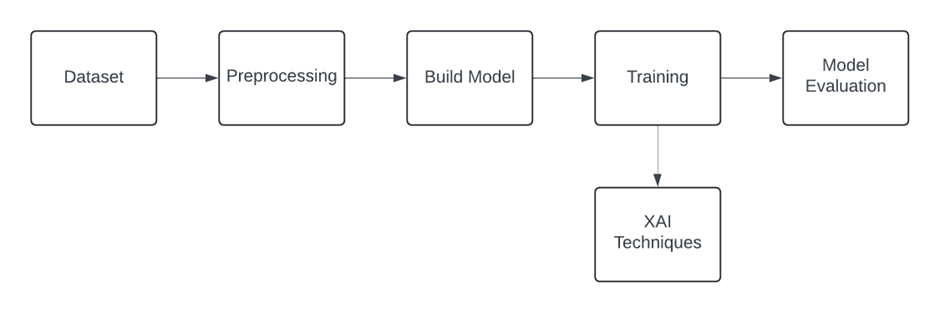

##Import the data

In [1]:
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 14.8 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import zipfile
import json
import random
import math
import io
import time

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision import datasets

from sklearn.metrics import confusion_matrix, precision_recall_fscore_support, roc_curve, auc

import shap

from google.colab import files
from google.colab.patches import cv2_imshow


zip_path = "/content/drive/MyDrive/balanced_dataset.zip"
temp_dir = "/content/data"

os.makedirs(temp_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(temp_dir)

#Preprocessing

##Data Augmentation and Loading

In [4]:
#Only apply augmentations to training data
data_transforms = {
    'train': transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(30),
        transforms.ToTensor(),
    ]),
    'val': transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
    ]),
    'test': transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
    ])
}

train_dataset = datasets.ImageFolder(root=os.path.join(temp_dir, "train"), transform=data_transforms['train'])
validation_dataset = datasets.ImageFolder(root=os.path.join(temp_dir, "val"), transform=data_transforms['val'])
test_dataset = datasets.ImageFolder(root=os.path.join(temp_dir, "test"), transform=data_transforms['test'])

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(validation_dataset)}")
print(f"Number of test samples: {len(test_dataset)}")

Number of training samples: 24626
Number of validation samples: 5328
Number of test samples: 5458


#Build the Model

##Model Architecture

In [5]:
class OriginalModel(nn.Module):
    def __init__(self):
        super(OriginalModel, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.classifier = nn.Sequential(
            nn.Linear(32 * 12 * 12, 8192),
            nn.ReLU(inplace=False),
            nn.Dropout(0.5),
            nn.Linear(8192, 8192),
            nn.ReLU(inplace=False),
            nn.Dropout(0.5),
            nn.Linear(8192, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [6]:
class BrainTumourModel(nn.Module):
    def __init__(self):
        super(BrainTumourModel, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.classifier = nn.Sequential(
            nn.Linear(32 * 6 * 6, 8192),
            nn.ReLU(inplace=False),
            nn.Dropout(0.5),
            nn.Linear(8192, 8192),
            nn.ReLU(inplace=False),
            nn.Dropout(0.5),
            nn.Linear(8192, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

model = BrainTumourModel()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

BrainTumourModel(
  (features): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

#Training

In [8]:
criterion = nn.BCELoss()
optimiser = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.1, patience=5, verbose=True)

def train(model, train_loader, val_loader, criterion, optimiser, num_epochs, filepath):
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        start_time = time.time()
        # Training
        model.train()
        train_loss = 0.0
        correct_train = 0
        total_train = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.float().to(device).unsqueeze(1)
            optimiser.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimiser.step()
            train_loss += loss.item() * inputs.size(0)

            # Calculate accuracy
            predicted = (outputs > 0.5).float()
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)

        train_loss /= len(train_loader.dataset)
        train_acc = correct_train / total_train
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        # Validation
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.float().to(device).unsqueeze(1)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)

                # Calculate accuracy
                predicted = (outputs > 0.5).float()
                correct_val += (predicted == labels).sum().item()
                total_val += labels.size(0)

        val_loss /= len(val_loader.dataset)
        val_acc = correct_val / total_val
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), filepath)

        epoch_time = time.time() - start_time
        print(f'epoch {epoch+1}/{num_epochs}, '
              f'train loss: {train_loss:.4f}, '
              f'val loss: {val_loss:.4f}, '
              f'train accuracy: {train_acc:.4f}, '
              f'val accuracy: {val_acc:.4f}, '
              f'time: {epoch_time:.2f} seconds')

    return history

## Train the model

In [ ]:
history = train(model, train_loader, val_loader, criterion, optimiser, num_epochs=30, filepath="improved_model.pth")

epoch 1/30, train loss: 0.4549, val loss: 0.4887, train accuracy: 0.7885, val accuracy: 0.7545, time: 81.23 seconds
epoch 2/30, train loss: 0.3305, val loss: 0.2876, train accuracy: 0.8630, val accuracy: 0.8859, time: 74.47 seconds
epoch 3/30, train loss: 0.2916, val loss: 0.2892, train accuracy: 0.8818, val accuracy: 0.8872, time: 71.29 seconds
epoch 4/30, train loss: 0.2723, val loss: 0.2571, train accuracy: 0.8915, val accuracy: 0.9022, time: 73.32 seconds
epoch 5/30, train loss: 0.2597, val loss: 0.3188, train accuracy: 0.8985, val accuracy: 0.8694, time: 71.93 seconds
epoch 6/30, train loss: 0.2517, val loss: 0.2417, train accuracy: 0.9018, val accuracy: 0.9125, time: 73.17 seconds
epoch 7/30, train loss: 0.2453, val loss: 0.2351, train accuracy: 0.9051, val accuracy: 0.9118, time: 72.34 seconds
epoch 8/30, train loss: 0.2373, val loss: 0.2573, train accuracy: 0.9092, val accuracy: 0.8971, time: 72.39 seconds
epoch 9/30, train loss: 0.2346, val loss: 0.2327, train accuracy: 0.9099

In [ ]:
with open('training_history_modified.json', 'w') as f:
    json.dump(history, f)

##Learning Curves

###Model Comparison

In [10]:
def load_history(filename):
    with open(filename, 'r') as f:
        return json.load(f)

history1 = load_history('/content/drive/MyDrive/DissModels/training_history_orignal.json')
history2 = load_history('/content/drive/MyDrive/DissModels/training_history_modified.json')

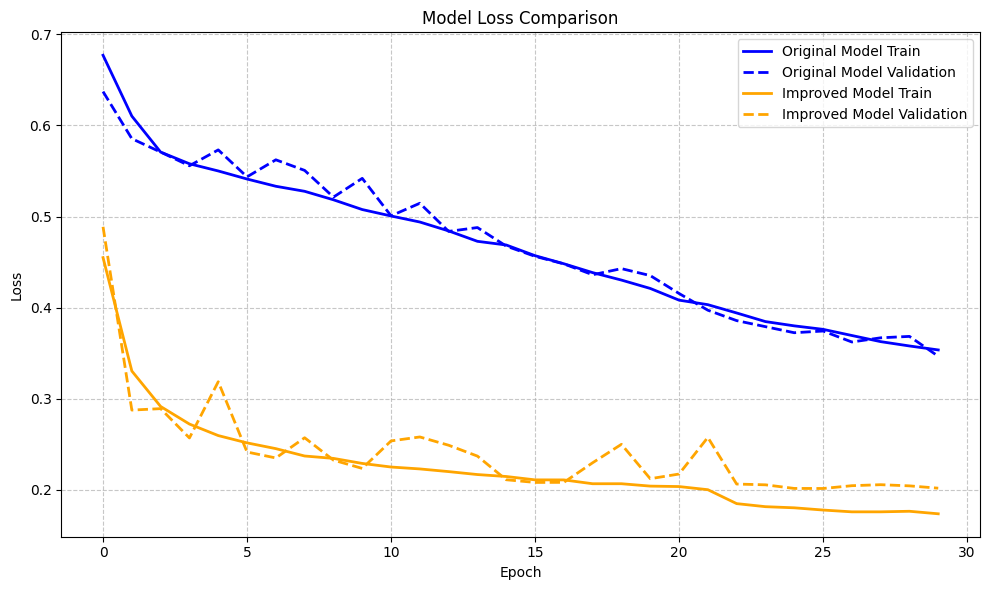

In [11]:
plt.figure(figsize=(10, 6))
plt.plot(history1['train_loss'], label='Original Model Train', color='b', linewidth=2, linestyle='-')
plt.plot(history1['val_loss'], label='Original Model Validation', color='b', linewidth=2, linestyle='--')
plt.plot(history2['train_loss'], label='Improved Model Train', color='orange', linewidth=2, linestyle='-')
plt.plot(history2['val_loss'], label='Improved Model Validation', color='orange', linewidth=2, linestyle='--')

plt.title('Model Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

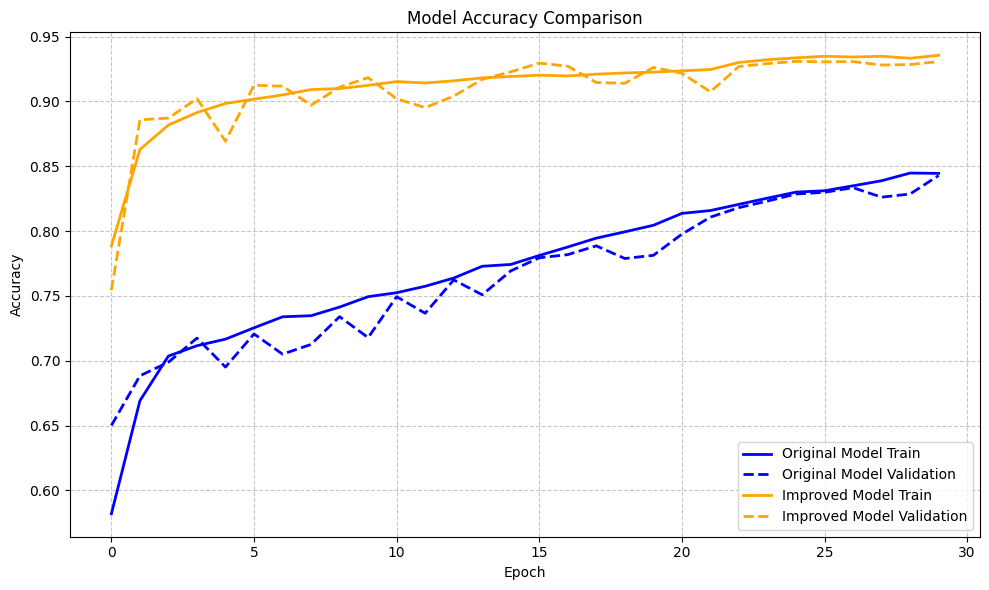

In [12]:
plt.figure(figsize=(10, 6))

plt.plot(history1['train_acc'], label='Original Model Train', color='b', linewidth=2, linestyle='-')
plt.plot(history1['val_acc'], label='Original Model Validation', color='b', linewidth=2, linestyle='--')
plt.plot(history2['train_acc'], label='Improved Model Train', color='orange', linewidth=2, linestyle='-')
plt.plot(history2['val_acc'], label='Improved Model Validation', color='orange', linewidth=2, linestyle='--')

plt.title('Model Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

###Train Accuracy vs Val Accuracy (Single Model Only)

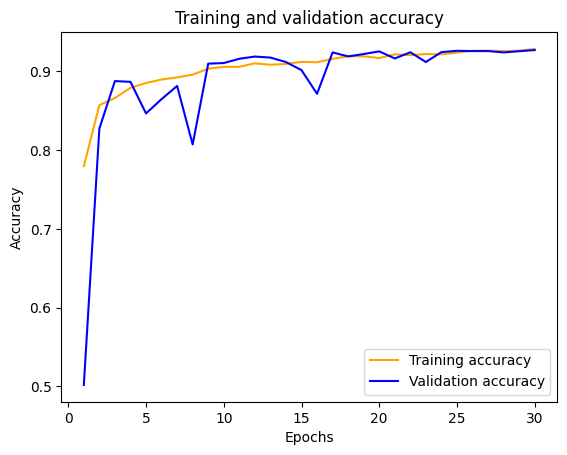

In [ ]:
train_acc = history['train_acc']
val_acc = history['val_acc']
epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_acc, 'orange', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

###Train Loss vs Val Loss (Single Model Only)

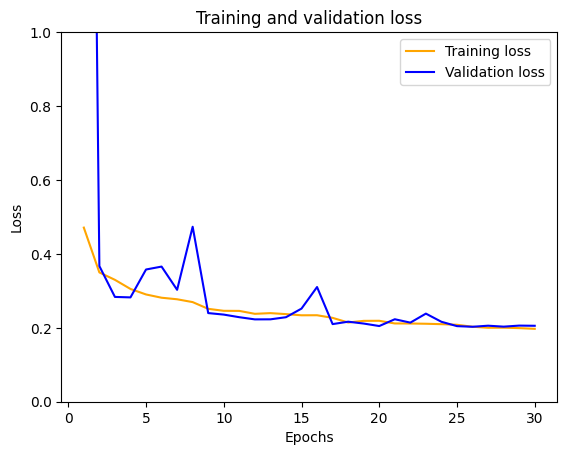

In [ ]:
train_loss = history['train_loss']
val_loss = history['val_loss']
epochs = range(1, len(train_loss) + 1)

plt.plot(epochs, train_loss, 'orange', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0, 1)
plt.legend()
plt.show()

#Model Evaluation

In [ ]:
model = BrainTumourModel()

# Load the state dict (uncomment other if running from scratch)
model.load_state_dict(torch.load('/content/drive/MyDrive/DissModels/improved_model.pth'))
# model.load_state_dict(torch.load('/content/improved_model.pth'))

<All keys matched successfully>

##Accuracy and Loss

In [ ]:
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.BCELoss()

def calculate_accuracy(model, dataloader):
    correct = 0
    total = 0
    total_loss = 0.0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)
            outputs = model(inputs)

            # Calculate loss
            loss = criterion(outputs, labels)
            total_loss += loss.item() * inputs.size(0)

            # Calculate accuracy
            predicted = (outputs > 0.5).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_loss = total_loss / len(dataloader.dataset)
    accuracy = correct / total
    return accuracy, avg_loss

test_accuracy, test_loss = calculate_accuracy(model, test_loader)
print(f"Test accuracy: {test_accuracy:.4f}")
print(f"Test loss: {test_loss:.4f}")

Test accuracy: 0.9126
Test loss: 0.2334


##Confusion Matrices

Precision: 0.9500
Recall: 0.8710
F1 Score: 0.9088


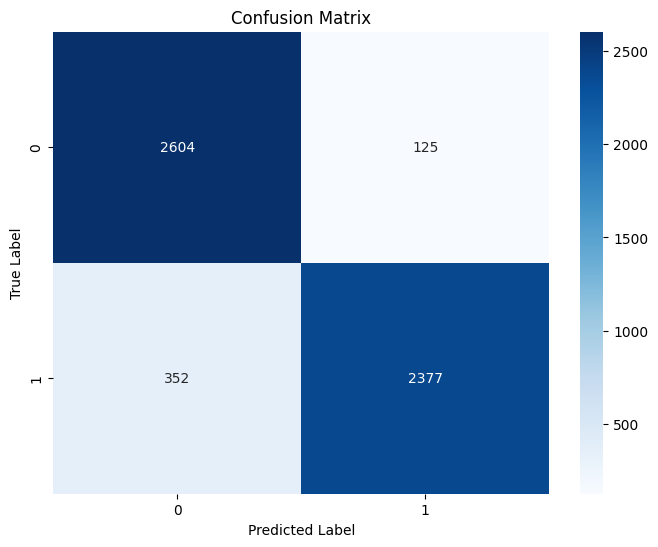

In [ ]:
def get_metrics(model, dataloader, device):
    model.eval()
    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            predicted = (outputs > 0.5).float()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_predictions = np.array(all_predictions).flatten()
    all_labels = np.array(all_labels).flatten()

    cm = confusion_matrix(all_labels, all_predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(all_labels, all_predictions, average='binary')

    return cm, precision, recall, f1

conf_matrix, precision, recall, f1 = get_metrics(model, test_loader, device)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

##Examine Misclassifications

In [ ]:
def get_misclassifications(model, dataloader, device):
    model.eval()
    false_positives = []
    false_negatives = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            predicted = (outputs.squeeze() > 0.5).float()

            fp_mask = (predicted == 1) & (labels == 0)
            fn_mask = (predicted == 0) & (labels == 1)

            false_positives.extend(inputs[fp_mask].cpu().numpy())
            false_negatives.extend(inputs[fn_mask].cpu().numpy())

    return false_positives, false_negatives

def visualise_misclassifications(misclassified_samples, sample_type):
    if len(misclassified_samples) == 0:
        print(f"No {sample_type} found.")
        return

    samples_per_row = 5
    num_samples = len(misclassified_samples)
    rows = math.ceil(num_samples / samples_per_row)

    fig, axes = plt.subplots(rows, samples_per_row, figsize=(samples_per_row*4, rows*4))
    fig.suptitle(f"All {sample_type} Samples")

    for i, sample in enumerate(misclassified_samples):
        row = i // samples_per_row
        col = i % samples_per_row
        ax = axes[row, col] if rows > 1 else axes[col]

        img = sample.transpose(1, 2, 0)  # Change from (C, H, W) to (H, W, C)
        if img.max() > 1.0:
            img = img / 255.0
        ax.imshow(img, cmap='gray')
        ax.set_title(f"Sample {i+1}")
        ax.axis('off')

    # Turn off any unused subplots
    for i in range(num_samples, rows * samples_per_row):
        row = i // samples_per_row
        col = i % samples_per_row
        ax = axes[row, col] if rows > 1 else axes[col]
        ax.axis('off')

    plt.tight_layout()
    plt.show()

false_positives, false_negatives = get_misclassifications(model, test_loader, device)

###False Postive Samples

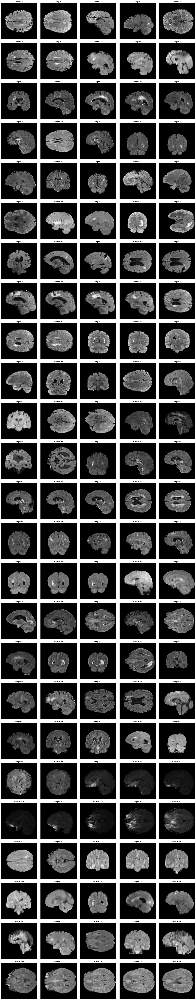

In [ ]:
visualise_misclassifications(false_positives, "False Positives")

###False Negative Samples

In [ ]:
visualise_misclassifications(false_negatives, "False Negatives")

##ROC-AUC

In [ ]:
model2 = OriginalModel()
model2.load_state_dict(torch.load('/content/drive/MyDrive/DissModels/original_model.pth'))
model2 = model2.to(device)

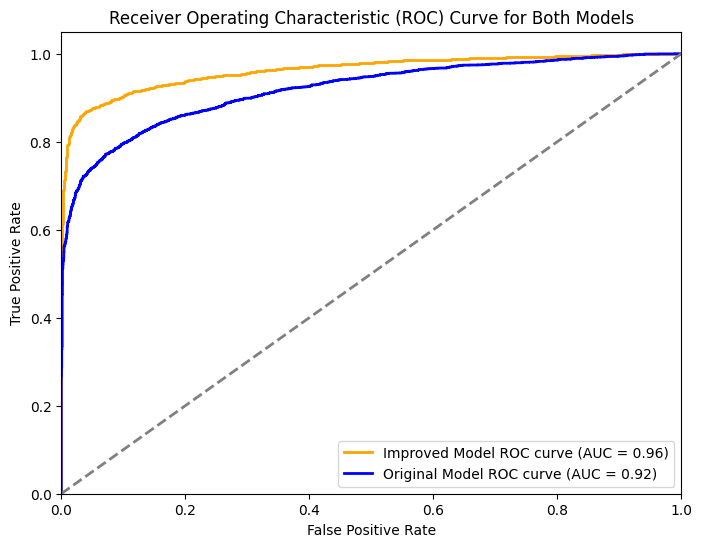

In [ ]:
def get_roc_data(model, dataloader, device):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(outputs.cpu().numpy())

    return np.array(all_labels).flatten(), np.array(all_probs).flatten()

all_labels1, all_probs1 = get_roc_data(model, test_loader, device)
all_labels2, all_probs2 = get_roc_data(model2, test_loader, device)

# Calculate ROC curve and AUC for both models
fpr1, tpr1, _ = roc_curve(all_labels1, all_probs1)
roc_auc1 = auc(fpr1, tpr1)

fpr2, tpr2, _ = roc_curve(all_labels2, all_probs2)
roc_auc2 = auc(fpr2, tpr2)

plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='orange', lw=2, label=f'Improved Model ROC curve (AUC = {roc_auc1:.2f})')
plt.plot(fpr2, tpr2, color='b', lw=2, label=f'Original Model ROC curve (AUC = {roc_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Both Models')
plt.legend(loc="lower right")
plt.show()


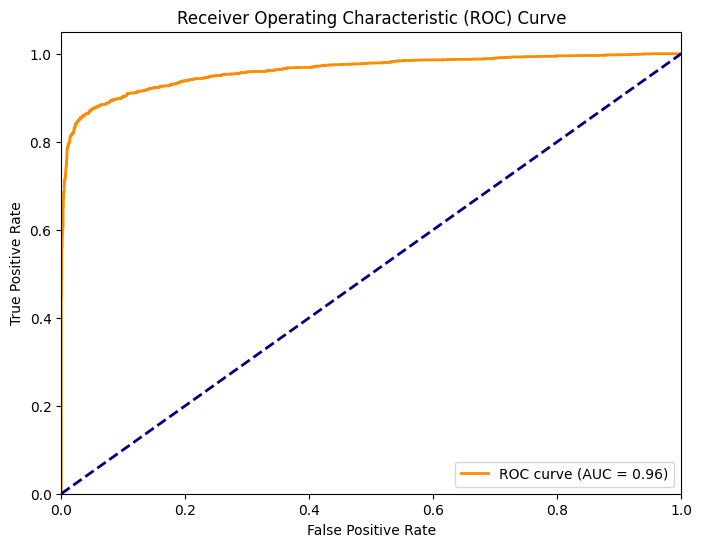

In [ ]:
#Plot a single ROC curve for improved model
def get_roc_data(model, dataloader, device):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(outputs.cpu().numpy())

    return np.array(all_labels).flatten(), np.array(all_probs).flatten()

all_labels, all_probs = get_roc_data(model, test_loader, device)

fpr, tpr, _ = roc_curve(all_labels, all_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

#XAI

In [13]:
# Initialize and load the model
model = BrainTumourModel()
model.load_state_dict(torch.load('/content/drive/MyDrive/DissModels/improved_model.pth'))
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

def set_bn_eval(module):
    if isinstance(module, torch.nn.BatchNorm2d):
        module.eval()
        module.weight.requires_grad = False
        module.bias.requires_grad = False

model.apply(set_bn_eval)

<ipython-input-13-e1934e949014>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/drive/MyDrive/DissModels/improved_model.pth'))


BrainTumourModel(
  (features): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

##GRAD-CAM

In [14]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_cam(self, input_image, target_class=None):
        self.model.eval()
        input_image = input_image.requires_grad_(True)

        # Forward pass
        output = self.model(input_image)

        if target_class is None:
            target_class = 1 if output.item() > 0.5 else 0

        # Backward pass
        self.model.zero_grad()
        output[0].backward(retain_graph=True)

        # Generate CAM
        gradients = self.gradients
        activations = self.activations
        weights = torch.mean(gradients, dim=[0, 2, 3])

        cam = torch.zeros(activations.shape[2:], dtype=torch.float32, device=activations.device)
        for i, w in enumerate(weights):
            cam += w * activations[0, i, :, :]

        cam = F.relu(cam)
        cam = F.interpolate(cam.unsqueeze(0).unsqueeze(0), size=input_image.shape[2:], mode='bilinear', align_corners=False)
        cam = cam.squeeze()
        cam = (cam - cam.min()) / (cam.max() - cam.min())

        return cam.detach().cpu().numpy()

In [15]:
def load_and_preprocess_image(image_path, device):
    transform = transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
    ])

    image = Image.open(image_path)
    image_tensor = transform(image)
    return image_tensor.unsqueeze(0).to(device)  # Add batch dimension

def show_cam_on_image(img, cam):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255

    img_rgb = np.stack([img]*3, axis=-1) # Convert grayscale to RGB
    cam_img = heatmap + img_rgb
    cam_img = cam_img / np.max(cam_img)
    return np.uint8(255 * cam_img)


def visualise_gradcam(model, image_path, target_layer, device):
    grad_cam = GradCAM(model, target_layer)
    input_tensor = load_and_preprocess_image(image_path, device)
    cam = grad_cam.generate_cam(input_tensor)

    np_image = input_tensor.squeeze().detach().cpu().numpy()
    np_image = (np_image - np_image.min()) / (np_image.max() - np_image.min())
    cam_image = show_cam_on_image(np_image, cam)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.imshow(np_image, cmap='gray')
    ax1.set_title('Original Image')
    ax1.axis('off')

    ax2.imshow(cam_image)
    ax2.set_title('GradCAM')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

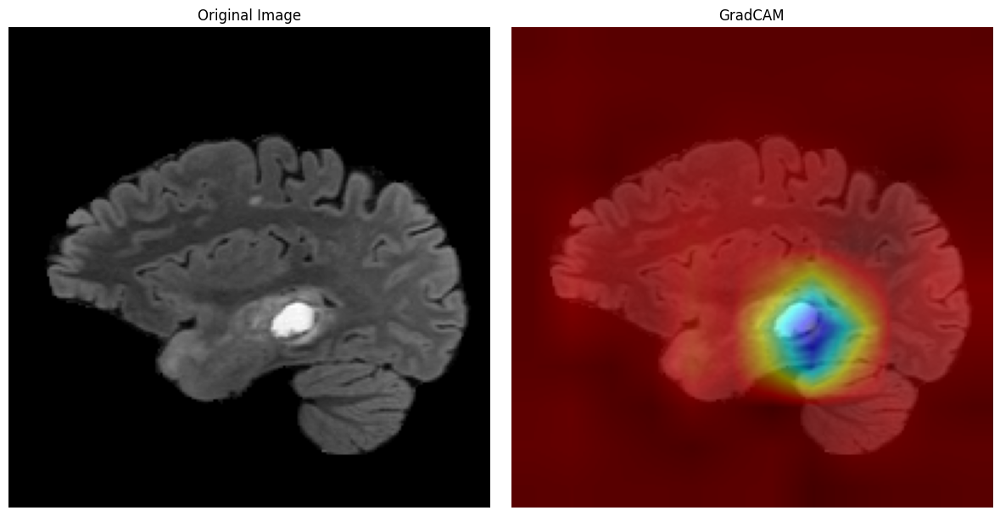

In [16]:
target_layer = model.features[16] #Last conv2d block

tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00061_side_slice_150.png'
visualise_gradcam(model, tumour_path, target_layer, device)

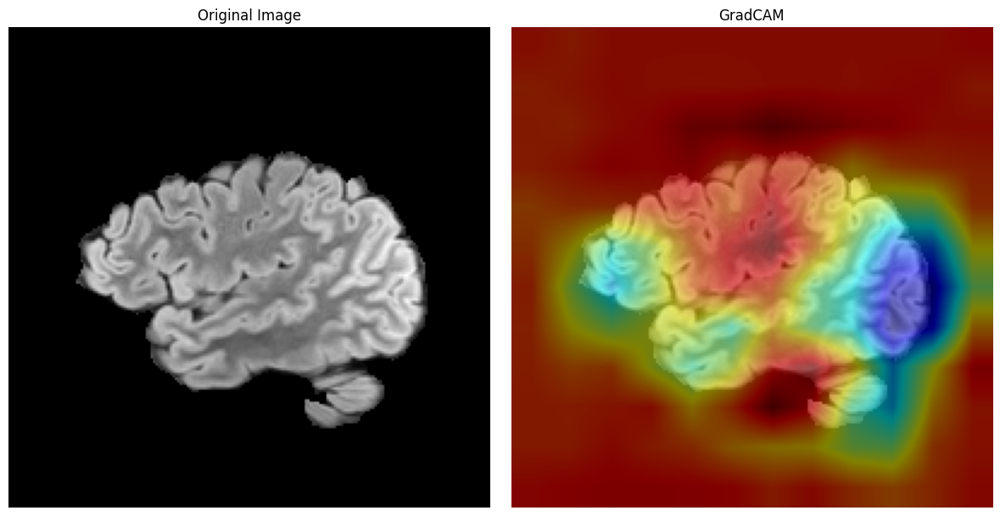

In [17]:
non_tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00024_side_slice_075.png'
visualise_gradcam(model, non_tumour_path, target_layer, device)

##LRP

In [18]:
class LRP:
    def __init__(self, model):
        self.model = model
        self.model.eval()

    def compute_lrp(self, input_image, target_class=None):
        input_image.requires_grad_(True)
        output = self.model(input_image)

        if target_class is None:
          target_class = 1 if output.item() > 0.5 else 0

        one_hot = torch.zeros_like(output)
        if target_class == 1:
            one_hot[0, 0] = 1  # Positive (Tumour) class
        else:
            one_hot[0, 0] = -1  # Negative (Non-Tumour) class

        # Backward pass
        output.backward(gradient=one_hot)

        lrp = input_image.grad.data.abs()
        lrp = lrp.sum(dim=1).squeeze()
        lrp = (lrp - lrp.min()) / (lrp.max() - lrp.min())

        return lrp.cpu().numpy()

def visualise_lrp(model, image_path, device, target_class=None):
    lrp = LRP(model)
    input_tensor = load_and_preprocess_image(image_path, device)
    lrp_result = lrp.compute_lrp(input_tensor, target_class)
    np_image = input_tensor.squeeze().detach().cpu().numpy()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.imshow(np_image, cmap='gray')
    ax1.set_title('Original Image')
    ax1.axis('off')

    im = ax2.imshow(lrp_result, cmap='hot')
    ax2.set_title('LRP')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

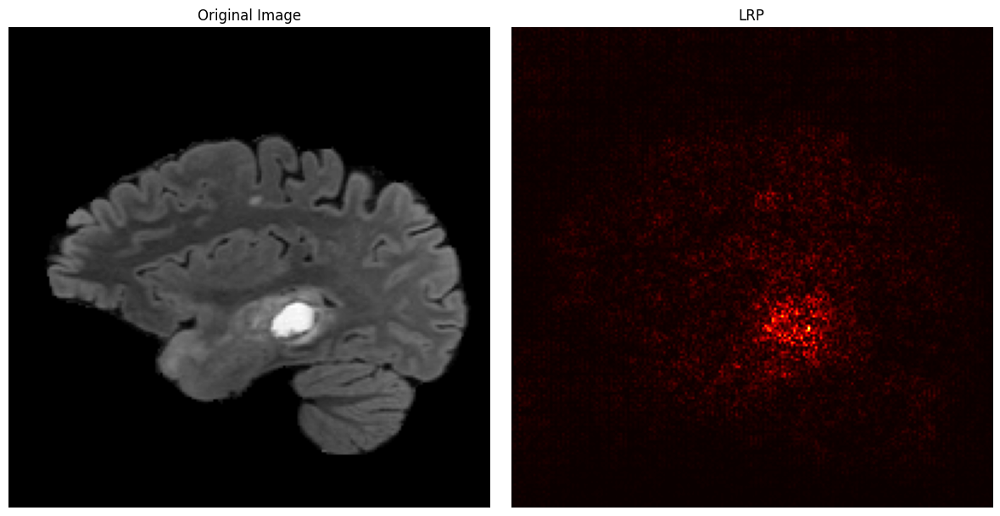

In [19]:
visualise_lrp(model, tumour_path, device)

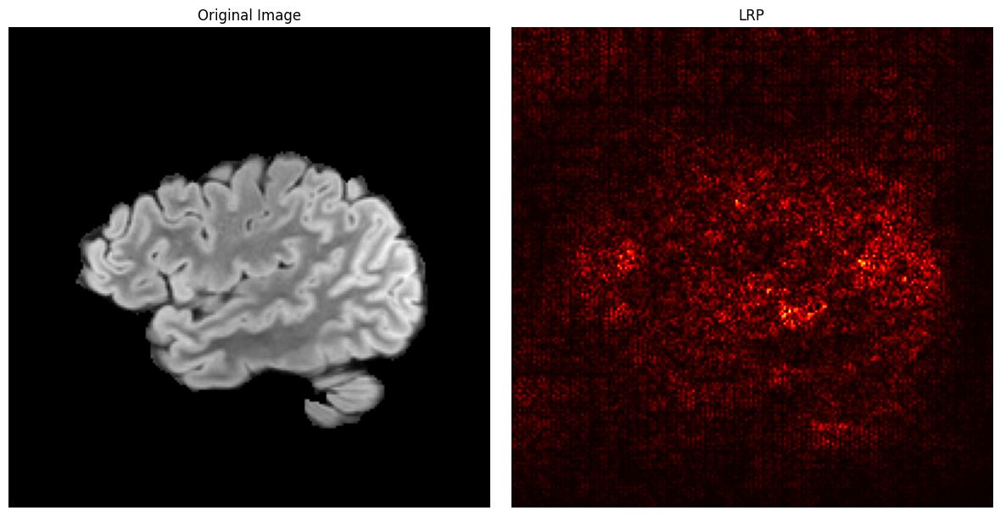

In [20]:
visualise_lrp(model, non_tumour_path, device)

##SHAP

In [21]:
class SHAPExplainer:
    def __init__(self, model, device, class_names=['Non-Tumour', 'Tumour']):
        self.model = model
        self.device = device
        self.class_names = class_names
        self.model.eval()

    def model_wrapper(self, images):
        with torch.no_grad():
            images_tensor = torch.FloatTensor(images).permute(0, 3, 1, 2).to(self.device)
            outputs = self.model(images_tensor)
            probs = torch.sigmoid(outputs).squeeze().cpu().numpy()
            return np.column_stack([1 - probs, probs])

    def load_and_preprocess_image_shap(self, image_path):
        transform = transforms.Compose([
            transforms.Grayscale(num_output_channels=1),
            transforms.ToTensor(),
        ])
        image = Image.open(image_path)
        image_tensor = transform(image)
        return image_tensor

    def explain(self, image, num_samples=1000):
        if image.dim() == 2:  # If it's 2D (H, W), add a channel dimension
            image = image.unsqueeze(0)

        image_hwc = image.permute(1, 2, 0).cpu().detach().numpy()  # Convert to HWC format for SHAP
        masker = shap.maskers.Image("blur(128,128)", image_hwc.shape)
        explainer = shap.Explainer(self.model_wrapper, masker, output_names=self.class_names)
        shap_values = explainer(image_hwc[np.newaxis, ...], max_evals=num_samples, batch_size=50)
        return shap_values

    def calculate_shap_percentages(self, shap_values_class, is_tumor):
        total_pixels = shap_values_class.size
        if is_tumor:
          positive_contrib = np.sum(shap_values_class < 0)  # Invert for tumor cases
          negative_contrib = np.sum(shap_values_class > 0)
        else:
          positive_contrib = np.sum(shap_values_class > 0)
          negative_contrib = np.sum(shap_values_class < 0)

        positive_percent = (positive_contrib / total_pixels) * 100
        negative_percent = (negative_contrib / total_pixels) * 100

        return positive_percent, negative_percent

    def visualise(self, image_path, num_samples=1000, target_class_label='Tumour'):
        # Load and preprocess image
        input_tensor = self.load_and_preprocess_image_shap(image_path)
        shap_values = self.explain(input_tensor, num_samples=num_samples)
        class_index = 1 if target_class_label == 'Tumour' else 0

        shap_values_class = shap_values.values[0, :, :, :, class_index]

        if target_class_label == 'Non-Tumour': #invert colours fro non-tumour classes
            shap_values_class = -shap_values_class

         # Calculate percentages
        is_tumor = (target_class_label == 'Tumour')
        pos_percent, neg_percent = self.calculate_shap_percentages(shap_values_class, is_tumor)

        # visualise SHAP values for the selected class
        shap.image_plot(shap_values_class, input_tensor.permute(1, 2, 0).numpy(), labels=[target_class_label], show=False)

        # Adjust aspect ratio
        _, h = plt.gcf().get_size_inches()
        plt.gcf().set_size_inches(h * 16 / 9, h)

        # Add percentage information to the plot
        plt.text(0.05, 0.05, f'Red: {pos_percent:.2f}%\nBlue: {neg_percent:.2f}%',
         transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.8))

        plt.show()


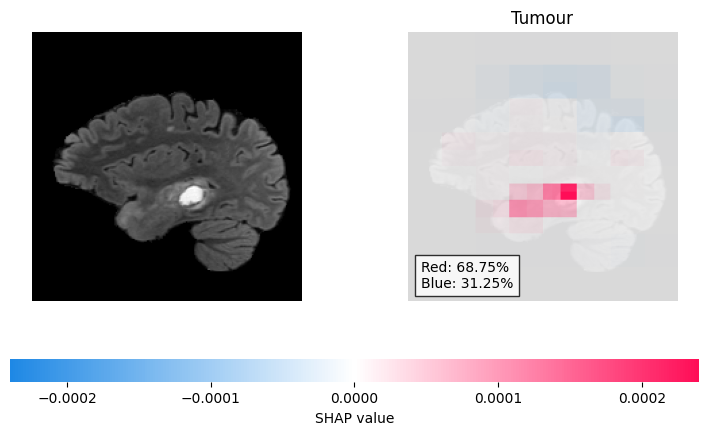

In [22]:
explainer = SHAPExplainer(model, device)
explainer.visualise(tumour_path, target_class_label='Tumour')

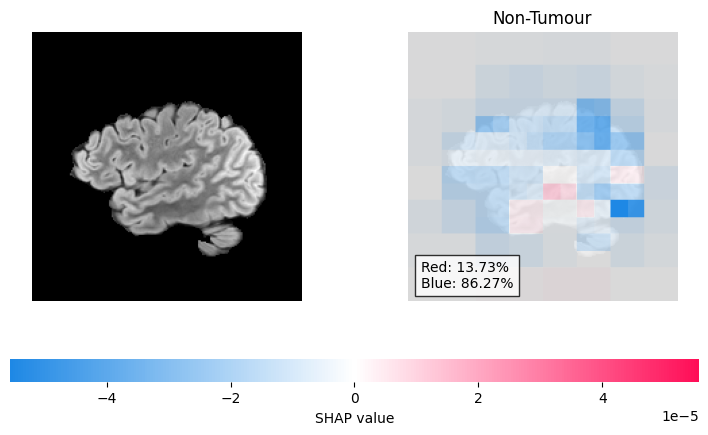

In [23]:
explainer.visualise(non_tumour_path, target_class_label='Non-Tumour')

#Combined XAI

In [24]:
def calculate_shap_percentages(shap_values_class, is_tumor):
        total_pixels = shap_values_class.size
        if is_tumor:
          positive_contrib = np.sum(shap_values_class < 0)  # Invert for tumor cases
          negative_contrib = np.sum(shap_values_class > 0)
        else:
          positive_contrib = np.sum(shap_values_class > 0)
          negative_contrib = np.sum(shap_values_class < 0)

        positive_percent = (positive_contrib / total_pixels) * 100
        negative_percent = (negative_contrib / total_pixels) * 100

        return positive_percent, negative_percent

def combined_xai_visualisation(model, image_path, target_layer, title, is_tumour, shap_explainer, device):
    # Load and preprocess image
    transform = transforms.Compose([transforms.Grayscale(num_output_channels=1), transforms.ToTensor()])
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()

    # Original image
    if image_tensor.squeeze().dim() == 3:
        np_image = image_tensor.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    else:
        np_image = image_tensor.squeeze().detach().cpu().numpy()

    # Grad-CAM
    grad_cam = GradCAM(model, target_layer)
    cam = grad_cam.generate_cam(image_tensor.clone())  # Use clone to avoid in-place
    cam_image = show_cam_on_image(np_image, cam)

    # LRP
    lrp = LRP(model)
    lrp_result = lrp.compute_lrp(image_tensor.clone(), target_class=1 if is_tumour else 0)

    # SHAP
    class_label = 'Tumour' if is_tumour else 'Non-Tumour'
    shap_values = shap_explainer.explain(image_tensor.squeeze().clone(), num_samples=2500)

    # Need to save SHAP as it can't be directly manipulated as a plot
    buf = io.BytesIO()
    shap_class = 1 if is_tumour else 0
    shap_values_class = shap_values.values[0, :, :, :, shap_class]

    if not is_tumour:
        shap_values_class = -shap_values_class

    supporting_percent, opposing_percent = calculate_shap_percentages(shap_values_class, is_tumour)

    shap.image_plot(shap_values_class, np_image, show=False)
    plt.text(0.05, 0.05, f'Red: {supporting_percent:.2f}%\nBlue: {opposing_percent:.2f}%',
             transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.8))
    plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
    plt.close()
    buf.seek(0)
    shap_image = Image.open(buf)

    fig = plt.figure(figsize=(15, 12))
    fig.suptitle(title, fontsize=16, fontweight='bold')

    # 3 plots on top
    ax1 = plt.subplot2grid((2, 3), (0, 0))
    ax2 = plt.subplot2grid((2, 3), (0, 1))
    ax3 = plt.subplot2grid((2, 3), (0, 2))

    # 1 plot below, spanning all 3 columns
    ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=3)
    ax1.imshow(np_image, cmap='gray')
    ax1.set_title('Original Image')
    ax1.axis('off')

    ax2.imshow(cam_image)
    ax2.set_title('Grad-CAM')
    ax2.axis('off')

    ax3.imshow(lrp_result, cmap='hot')
    ax3.set_title('LRP')
    ax3.axis('off')

    # Display SHAP image
    ax4.imshow(shap_image)
    ax4.set_title('SHAP')
    ax4.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


##Top View

In [25]:
shap_explainer = SHAPExplainer(model, device)
target_layer = model.features[16]

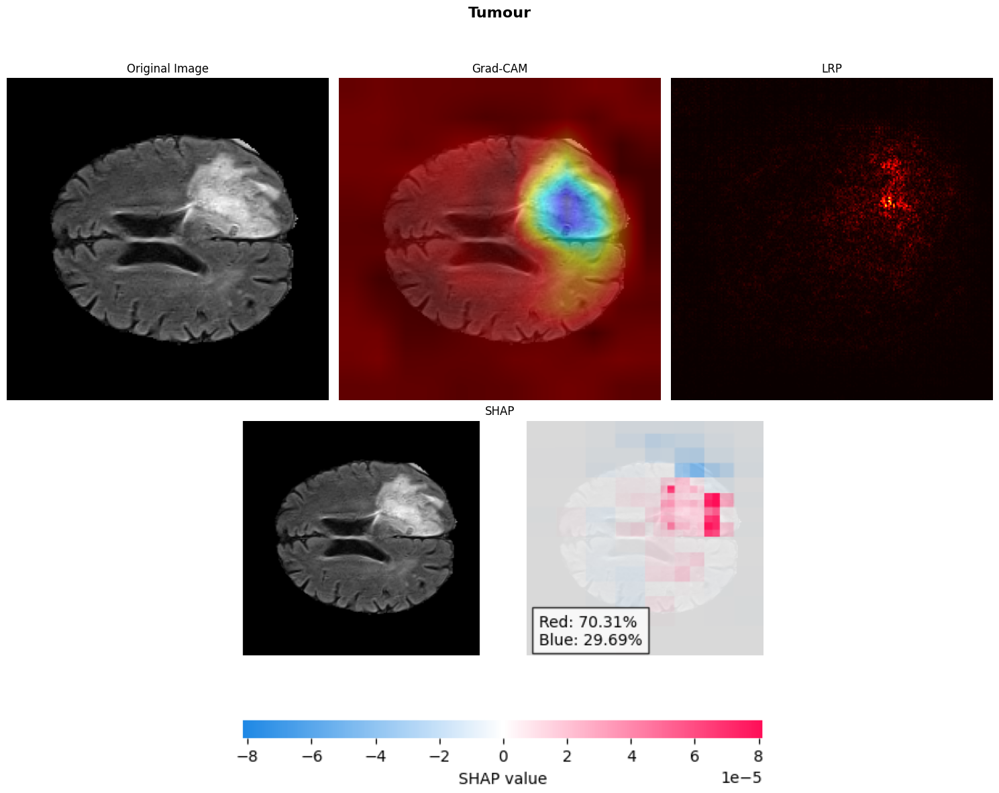

In [26]:
# Call combined_xai_visualisation with the appropriate parameters
top_tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00310_top_slice_090.png'
combined_xai_visualisation(model, top_tumour_path, target_layer=target_layer, title="Tumour", is_tumour=True, shap_explainer=shap_explainer, device=device)

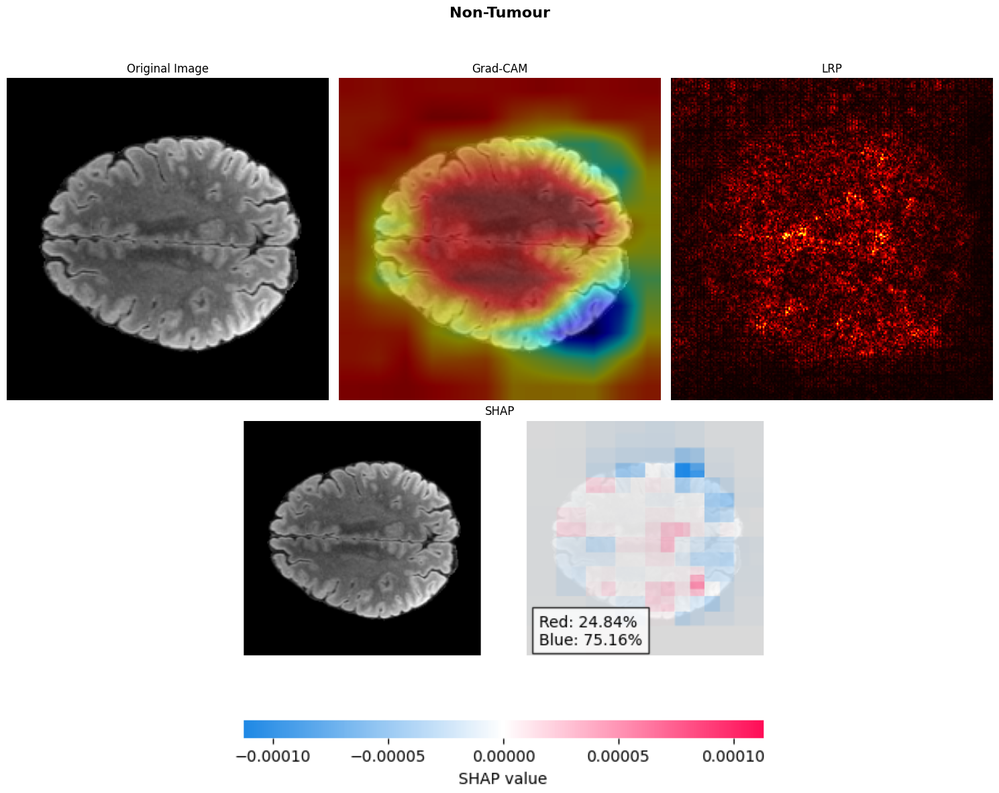

In [27]:
top_no_tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00688_top_slice_095.png'
combined_xai_visualisation(model, top_no_tumour_path, target_layer=target_layer, title="Non-Tumour", is_tumour=False, shap_explainer=shap_explainer, device=device)


##Side View

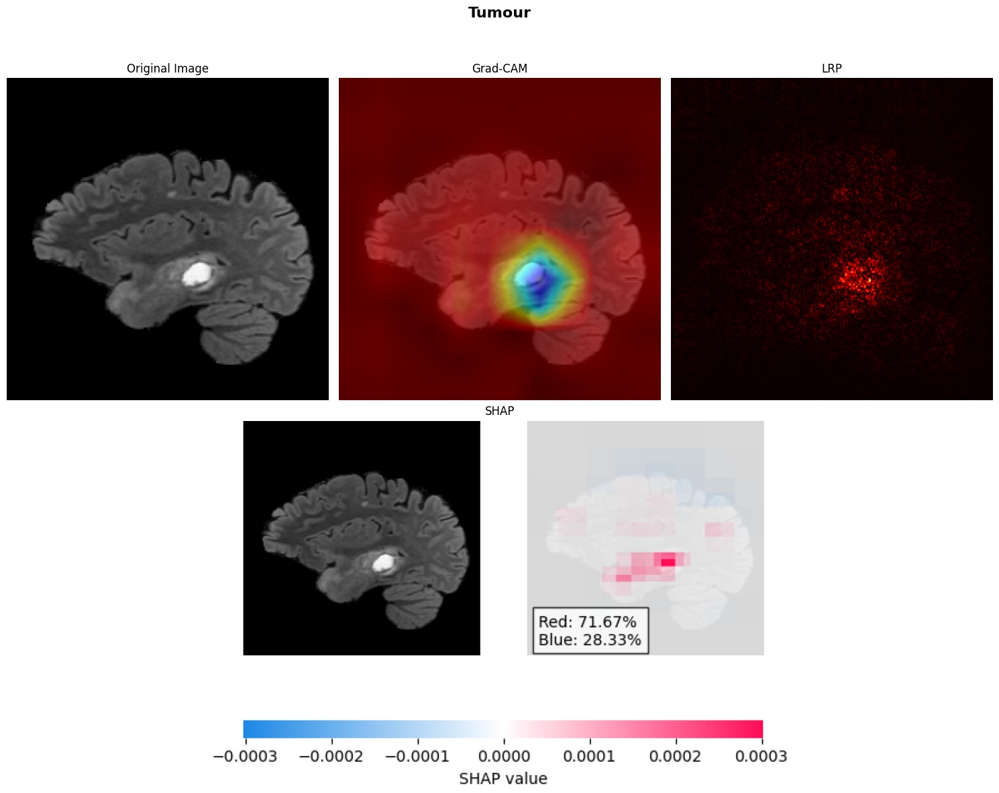

In [28]:
tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00061_side_slice_150.png'
combined_xai_visualisation(model, tumour_path, target_layer=target_layer, title="Tumour", is_tumour=True, shap_explainer=shap_explainer, device=device)


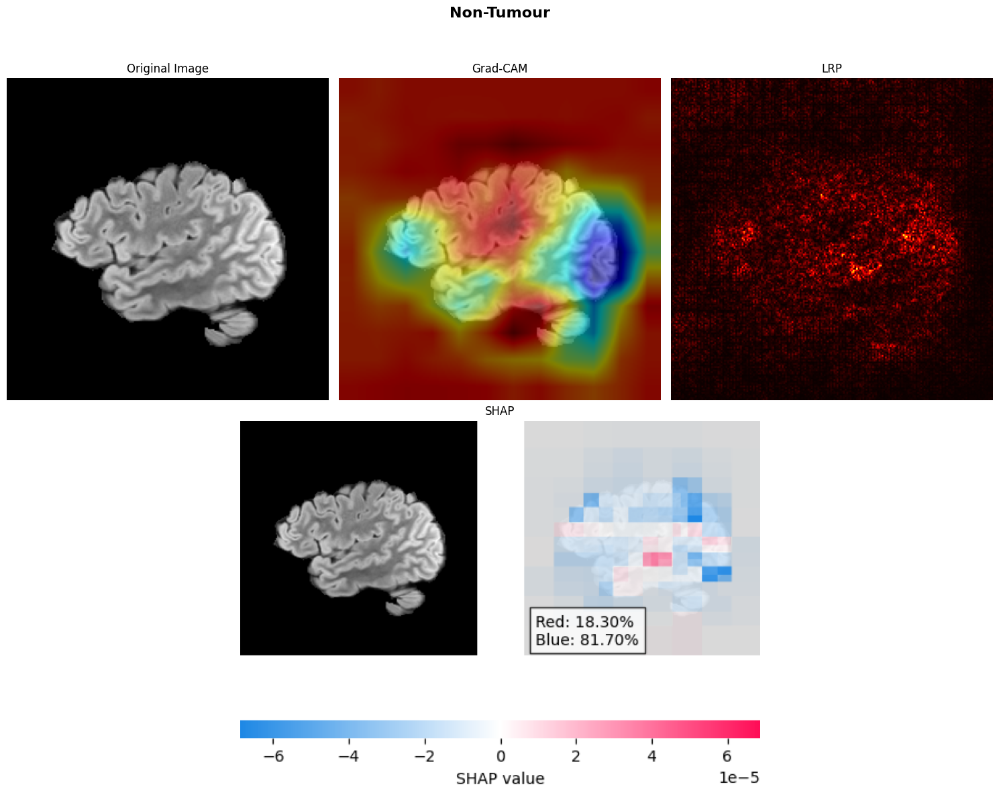

In [29]:
non_tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00024_side_slice_075.png'
combined_xai_visualisation(model, non_tumour_path, target_layer=target_layer, title="Non-Tumour", is_tumour=False, shap_explainer=shap_explainer, device=device)


##Front View

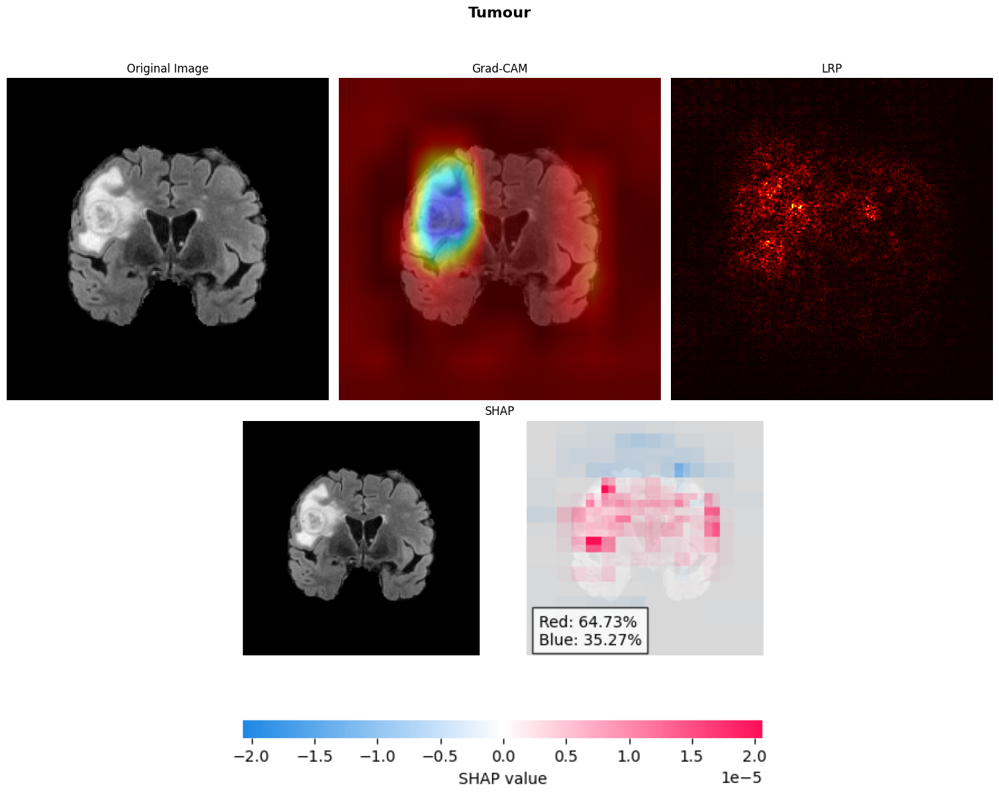

In [30]:
front_tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00066_front_slice_105.png'
combined_xai_visualisation(model, front_tumour_path, target_layer=target_layer, title="Tumour", is_tumour=True, shap_explainer=shap_explainer, device=device)

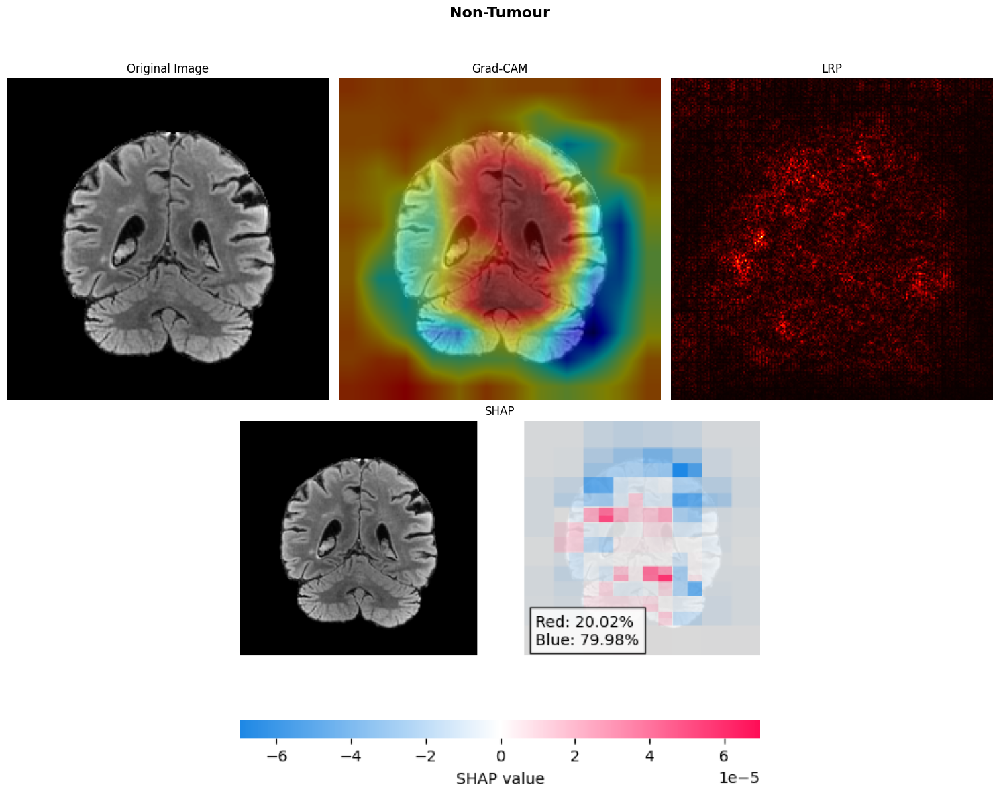

In [31]:
front_no_tumour_path = '/content/drive/MyDrive/XAI images/BraTS2021_00675_front_slice_155.png'
combined_xai_visualisation(model, front_no_tumour_path, target_layer=target_layer, title="Non-Tumour", is_tumour=False, shap_explainer=shap_explainer, device=device)

##Partial Cases

In [32]:
partial_flair ='/content/drive/MyDrive/XAI images/Partial/BraTS2021_00020_top_slice_090_flair.png'
partial_seg = '/content/drive/MyDrive/XAI images/Partial/BraTS2021_00020_top_slice_090_mask.png'

In [33]:
def predict_single_image(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        # image_tensor = image_tensor.unsqueeze(0).to(device)  # Now shape is (1, C, H, W)
        output = model(image_tensor.to(device))
        probability = torch.sigmoid(output).item()
        prediction = 1 if probability > 0.5 else 0
    return prediction, probability

In [34]:
image_tensor = load_and_preprocess_image(partial_flair, device)
prediction, probabilities = predict_single_image(model, image_tensor, device)

print(f"Prediction: {prediction}")
print(f"Probabilities: {probabilities}")

Prediction: 1
Probabilities: 0.6786463856697083


In [35]:
def combined_xai_visualisation_partial(model, flair_image_path, seg_image_path, target_layer, title, is_tumour, shap_explainer, device):
    # Load and preprocess FLAIR image
    transform = transforms.Compose([transforms.Grayscale(num_output_channels=1), transforms.ToTensor()])
    flair_image = Image.open(flair_image_path)
    flair_tensor = transform(flair_image).unsqueeze(0).to(device)

    # Load segmentation mask
    seg_image = Image.open(seg_image_path)
    seg_tensor = transform(seg_image).squeeze().to(device)

    # Overlay mask on FLAIR image
    flair_np = flair_tensor.squeeze().cpu().numpy()
    seg_np = seg_tensor.cpu().numpy()
    overlay = flair_np * 0.7 + seg_np * 0.3

    # Grad-CAM
    grad_cam = GradCAM(model, target_layer)
    cam = grad_cam.generate_cam(flair_tensor)
    cam_image = show_cam_on_image(overlay, cam)

    # LRP
    lrp = LRP(model)
    lrp_result = lrp.compute_lrp(flair_tensor, 1)

    # SHAP
    class_label = 'Tumour' if is_tumour else 'Non-Tumour'
    shap_values = shap_explainer.explain(flair_tensor.squeeze(), num_samples=2500)

    # Need to save SHAP as it can't be directly manipulated as a plot
    buf = io.BytesIO()
    shap_class = 1 if is_tumour else 0
    shap_values_class = shap_values.values[0, :, :, :, shap_class]

    if not is_tumour:
        shap_values_class = -shap_values_class

    supporting_percent, opposing_percent = calculate_shap_percentages(shap_values_class, is_tumour)

    shap.image_plot(shap_values_class, overlay, show=False)
    plt.text(0.05, 0.05, f'Red: {supporting_percent:.2f}%\nBlue: {opposing_percent:.2f}%',
             transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.8))
    plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
    plt.close()
    buf.seek(0)
    shap_image = Image.open(buf)

    fig = plt.figure(figsize=(15, 12))
    fig.suptitle(title, fontsize=16, fontweight='bold')

    # 3 plots on top
    ax1 = plt.subplot2grid((2, 3), (0, 0))
    ax2 = plt.subplot2grid((2, 3), (0, 1))
    ax3 = plt.subplot2grid((2, 3), (0, 2))

    # 1 plot below, spanning all 3
    ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=3)
    ax1.imshow(overlay, cmap='gray')
    ax1.set_title('FLAIR Image with Segmentation Overlay')
    ax1.axis('off')

    ax2.imshow(cam_image)
    ax2.set_title('Grad-CAM')
    ax2.axis('off')

    ax3.imshow(lrp_result, cmap='hot')
    ax3.set_title('LRP')
    ax3.axis('off')

    # Display SHAP image
    ax4.imshow(shap_image)
    ax4.set_title('SHAP')
    ax4.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


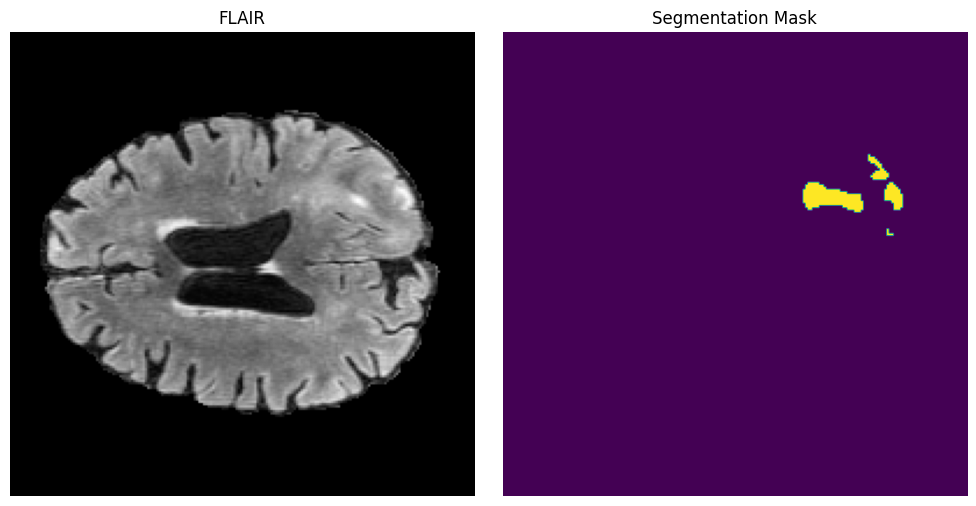

In [36]:
img1 = Image.open(partial_flair)
img2 = Image.open(partial_seg)
img1_array = np.array(img1)
img2_array = np.array(img2)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(img1_array, cmap='gray')
ax1.axis('off')
ax1.set_title('FLAIR')

ax2.imshow(img2_array)
ax2.axis('off')
ax2.set_title('Segmentation Mask')

plt.tight_layout()
plt.show()

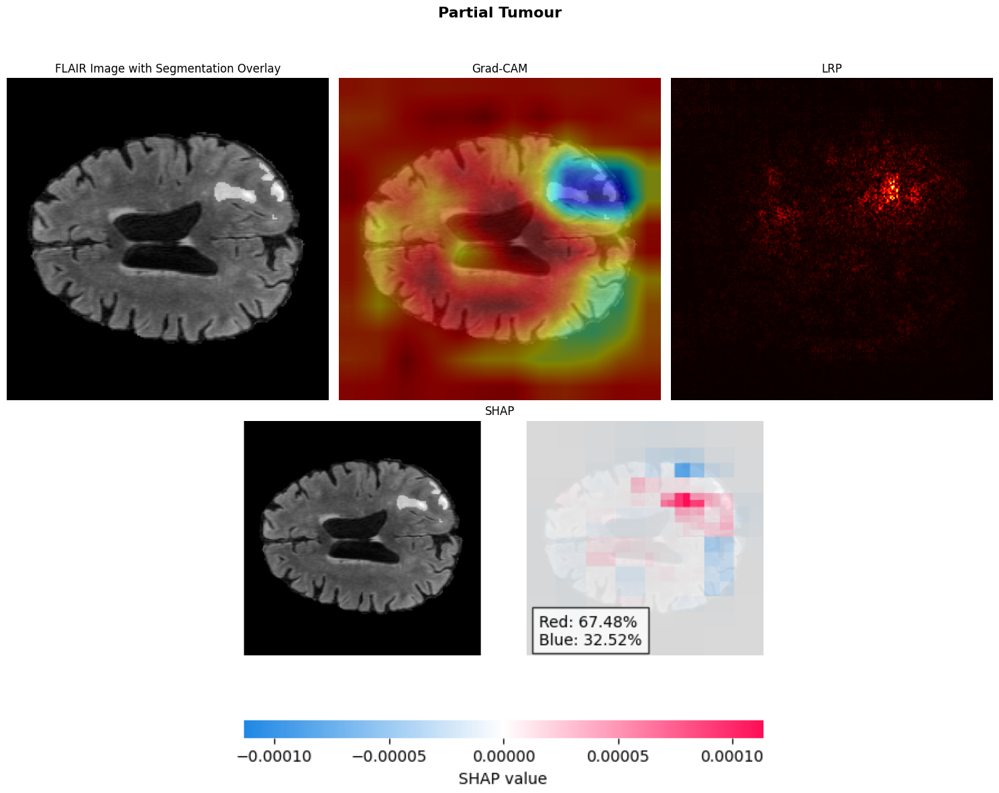

In [37]:
combined_xai_visualisation_partial(
    model=model,
    flair_image_path=partial_flair,
    seg_image_path=partial_seg,
    target_layer=target_layer,
    title="Partial Tumour",
    is_tumour=True,
    shap_explainer=shap_explainer,
    device=device
)